In [10]:
from giflib import create_gif, display_gif, gif_folder

In [13]:
create_gif()

Button(description='Validate', style=ButtonStyle())

Output()

Output()

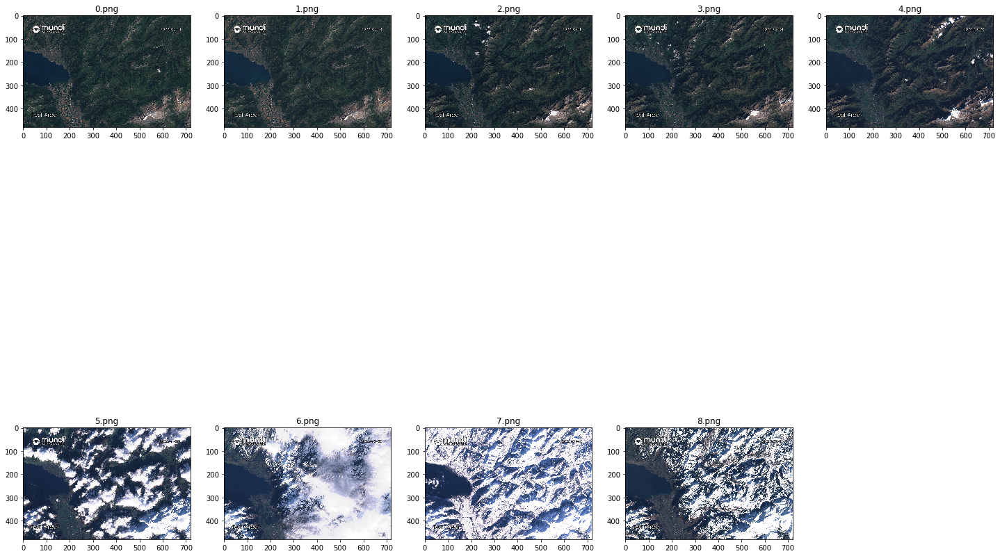

In [14]:
gif_folder()

In [5]:
display_gif()

Dropdown(description='File to open', options=('output.gif',), value='output.gif')

Button(description='Display GIF', style=ButtonStyle())

Output()

In [16]:
from waterlib import define_parameters_first_map, define_parameters_second_map

In [18]:
define_parameters_first_map()

DatePicker(value=datetime.date(2023, 2, 7), description='Starting Date')

DatePicker(value=datetime.date(2023, 3, 10), description='Stopping Date')

Button(description='Validate', style=ButtonStyle())

Output()

Output()

In [5]:
from mundilib import MundiCatalogue

# other tools
import os
import numpy as np
from osgeo import gdal
import matplotlib.pyplot as plt

In [6]:


# getting image from Mundi
c = MundiCatalogue()
wms = c.get_collection("Sentinel2").mundi_wms('L1C')

response = wms.getmap(layers=['92_NDWI'],
                     srs='EPSG:3857',
                     bbox=(497987.2393,6225872.3909,512968.8968,6239592.8374), # Toulouse
                     size=(600, 300),
                     format='image/png',
                     time='2022-03-21/2022-04-21',
                     showlogo=False,
                     transparent=False)



NameError: name 'MundiCatalogue' is not defined

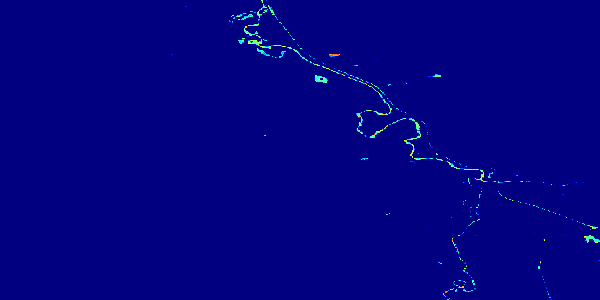

In [29]:
display(Image.open(response))

In [30]:
data = response.read()
vsipath = '/vsimem/img'
gdal.FileFromMemBuffer(vsipath, data)
raster_ds = gdal.Open(vsipath)
print (type(raster_ds))

# Projection
print ("Projection: ", format(raster_ds.GetProjection()))

# Dimensions
print ("X: ", raster_ds.RasterXSize)
print ("Y: ", raster_ds.RasterYSize)

# Number of bands
print ("Nb of bands: ", raster_ds.RasterCount)

# band informations
print ("Bands information:")
for band in range(raster_ds.RasterCount):
    band += 1
    srcband = raster_ds.GetRasterBand(band)
    if srcband is None:
        continue
    stats = srcband.GetStatistics( True, True )
    if stats is None:
        continue
    print (" - band #%d : Minimum=%.3f, Maximum=%.3f, Mean=%.3f, StdDev=%.3f" % ( \
                band, stats[0], stats[1], stats[2], stats[3] ))

<class 'osgeo.gdal.Dataset'>
Projection:  
X:  600
Y:  300
Nb of bands:  4
Bands information:
 - band #1 : Minimum=0.000, Maximum=0.000, Mean=0.000, StdDev=0.000
 - band #2 : Minimum=0.000, Maximum=0.000, Mean=0.000, StdDev=0.000
 - band #3 : Minimum=128.000, Maximum=128.000, Mean=128.000, StdDev=0.000
 - band #4 : Minimum=0.000, Maximum=0.000, Mean=0.000, StdDev=0.000


In [31]:


# Getting first band of the raster as separate variable
band1 = raster_ds.GetRasterBand(1)  
    
# Check type of the variable 'band'
print (type(band1))

# Data type of the values
gdal.GetDataTypeName(band1.DataType)



<class 'osgeo.gdal.Band'>


'Byte'

In [32]:


# getting array from band dataset
band1_ds = band1.ReadAsArray()

# The .ravel method turns an 2-D numpy array into a 1-D vector
print (band1_ds.shape)
print (band1_ds.ravel().shape)

# Print only selected metadata:
print ("No data value :", band1.GetNoDataValue()) # none
print ("Min value     :", band1.GetMinimum())
print ("Max value     :", band1.GetMaximum())

# Compute statistics if needed
if band1.GetMinimum() is None or band1.GetMaximum()is None:
    band1.ComputeStatistics(0)
    print("Statistics computed.")

# Fetch metadata for the band
band1.GetMetadata()



(300, 600)
(180000,)
No data value : None
Min value     : 0.0
Max value     : 0.0


{'STATISTICS_APPROXIMATE': 'YES',
 'STATISTICS_MAXIMUM': '0',
 'STATISTICS_MEAN': '0',
 'STATISTICS_MINIMUM': '0',
 'STATISTICS_STDDEV': '0',
 'STATISTICS_VALID_PERCENT': '100'}

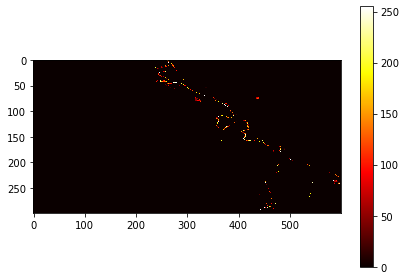

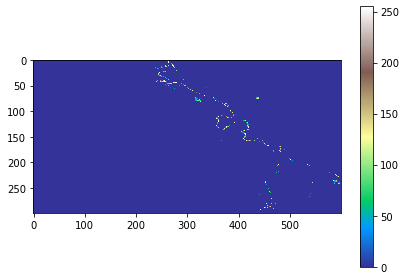

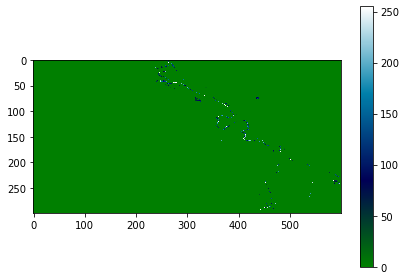

In [33]:
for c in ["hot", "terrain", "ocean"]:
    plt.imshow(band1_ds, cmap = c, interpolation='nearest')
    plt.colorbar()
    plt.tight_layout()
    plt.show()

In [7]:


from mundilib import MundiCatalogue
from utils import height2width
from PIL import Image
import requests
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle

In [8]:
# Tutaj slc maska poleci
c = MundiCatalogue()
wms = c.get_collection("Sentinel2").mundi_wms('L2A')

In [4]:
img_tc = wms.getmap(layers=['TRUE_COLOR'],
                     srs='EPSG:3857',
                     bbox=(752904.7286,5826183.1700,819252.0692,5871128.1426), # Toulouse
                     size=(600, 300),
                     format='image/png',
                     time='2022-03-21/2022-04-21',
                     showlogo=False,
                     transparent=False)

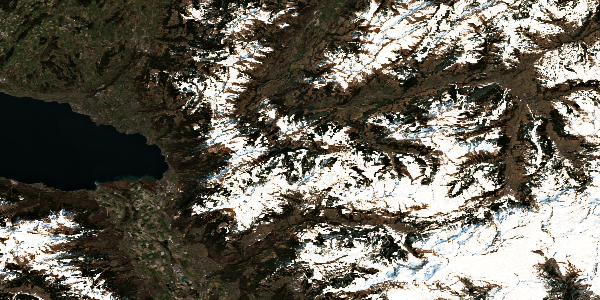

In [5]:
display(Image.open(img_tc))

In [4]:

img_scl = wms.getmap(layers=['SCL'],
                     srs='EPSG:3857',
                     bbox=(752904.7286,5826183.1700,819252.0692,5871128.1426), # Toulouse
                     size=(600, 300),
                     format='image/png',
                     time='2022-03-21/2022-04-21',
                     showlogo=False,
                     transparent=False)

display(Image.open(img_scl))



NameError: name 'wms' is not defined

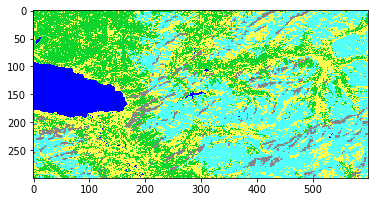

In [7]:
scl_array = np.asarray(Image.open(img_scl))
plt.imshow(scl_array)
plt.show()

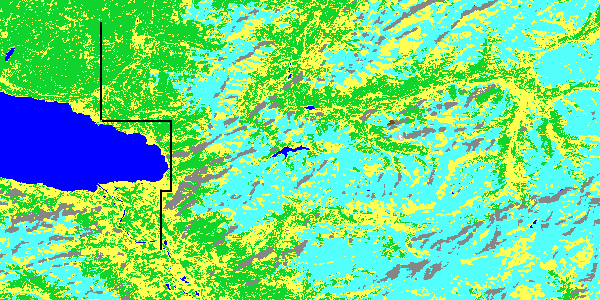

In [78]:
img_scl_raw = wms.getmap(layers=['SCL_GRAYSCALE'],
                     srs='EPSG:3857',
                     bbox=(752904.7286,5826183.1700,819252.0692,5871128.1426), # Toulouse
                     size=(600, 300),
                     format='image/png',
                     time='2022-03-21/2022-04-21',
                     showlogo=False,
                     transparent=False)

scl_raw_array = np.asarray(Image.open(img_scl_raw))
scl_array = np.asarray(Image.open(img_scl))

# def conc(list):
#     temp = 0
#     for x in range(len(list)):
#         print(x)
#         np.concen
        


a = (scl_raw_array[22:120, 100],
scl_raw_array[120, 100:170],
scl_raw_array[120:190,170],
scl_raw_array[190,160:172],
scl_raw_array[190:250,160])

mobility = np.concatenate(a)
mobility_visualization = scl_array[150, 50:600]

# mobility = list(mobility/23) # Store terrain data as a list for better usability latter
mobility = list(mobility/23)
# line visualisation
writable_array = scl_array.copy()
writable_array[22:120, 100:102][:] = [0, 0, 0]
writable_array[120:122,102:170][:] = [0,0,0]
writable_array[120:190,170:172][:] = [0,0,0]
writable_array[190:192,160:172][:] = [0,0,0]
writable_array[190:250,160:162][:] = [0,0,0]

image = Image.fromarray(writable_array)
display(image)
image.save("test2.png")




In [76]:

legend_data = [[0, [0, 0, 0], 'No Data'],
              [1, [1, 0, 0.016], 'Saturated / Defective'],
              [2, [0.525, 0.525, 0.525], 'Dark Area'],
              [3, [0.467, 0.298, 0.043], 'Cloud shadows'],
              [4, [0.063, 0.827, 0.176], 'Vegetation'],
              [5, [1, 1, 0.325], 'Bare soil'],
              [6, [0, 0, 1], 'Water'],
              [7, [0.506, 0.506, 0.506], 'Clouds low probability / Unclassified'],
              [8, [0.753, 0.753, 0.753], 'Clouds medium probability'],
              [9, [0.949, 0.949, 0.949], 'Clouds high probability'],
              [10, [0.733, 0.773, 0.925], 'Cirrus'],
              [11, [0.325, 1, 0.980], 'Snow / Ice']]

legend_dict = dict()
for values in legend_data:
    legend_dict[values[0]] = values[2]



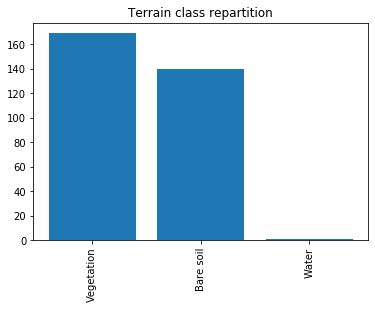

In [79]:

# Getting the list of unique values 
x = [] # Init x
y = [] # Init y

for classes in set(mobility):
    y.append(mobility.count(classes))
    x.append(legend_dict[classes])

plt.bar(x, y)
plt.xticks(rotation=90)
plt.title("Terrain class repartition")
plt.show()



['09_NDVI', '1_NATURAL_COL0R', 'NATURAL-COLOR', '2_COLOR_INFRARED__VEGETATION_', '3_FALSE_COLOR__URBAN_', '4_AGRICULTURE', '5_VEGETATION_INDEX', '6_MOISTURE_INDEX', '7_GEOLOGY', '8_BATHYMETRIC', '90_ATMOSPHERIC_PENETRATION', '91_SWIR', '93-SWIR-2-11-12', '92_NDWI', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B10', 'B11', 'B12', 'B8A']
09_NDVI


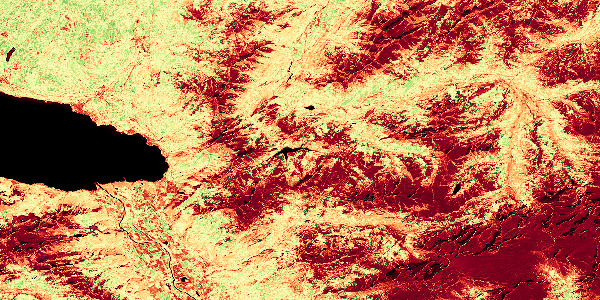

1_NATURAL_COL0R


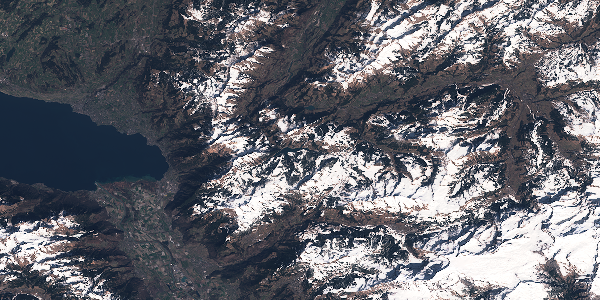

NATURAL-COLOR


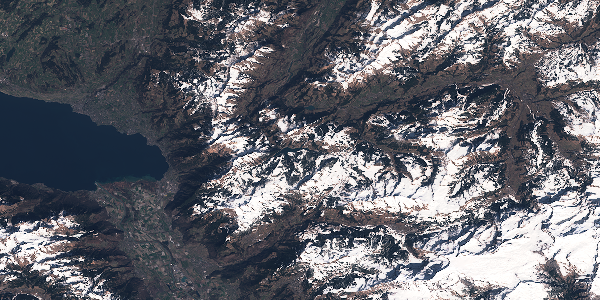

2_COLOR_INFRARED__VEGETATION_


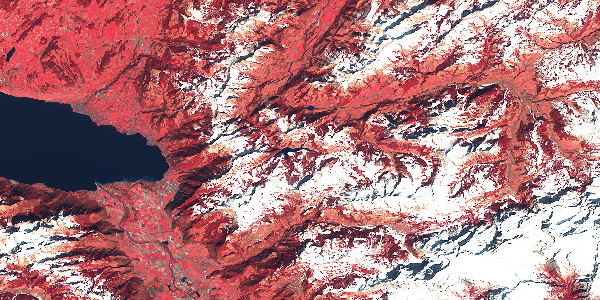

3_FALSE_COLOR__URBAN_


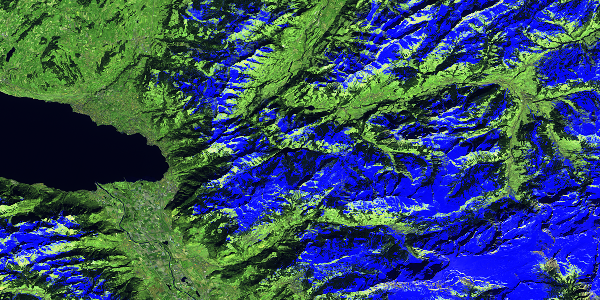

4_AGRICULTURE


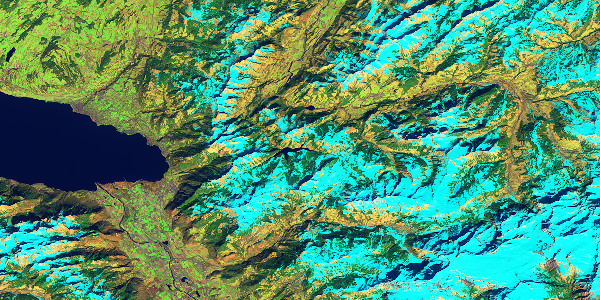

5_VEGETATION_INDEX


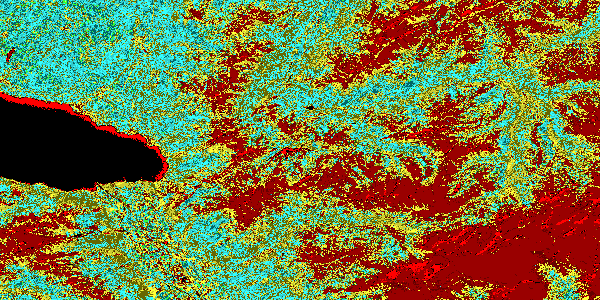

6_MOISTURE_INDEX


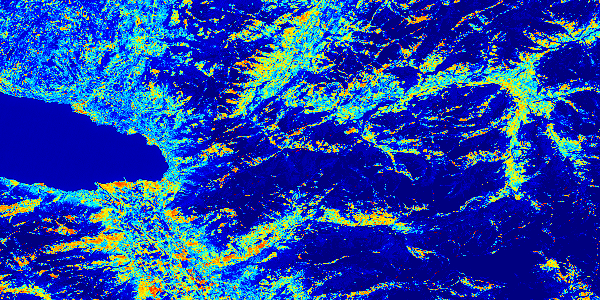

7_GEOLOGY


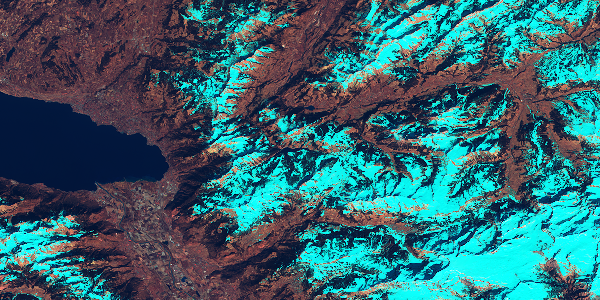

8_BATHYMETRIC


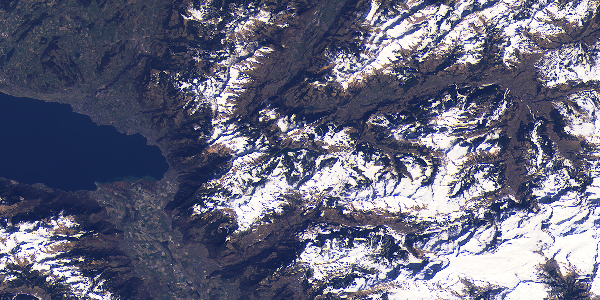

90_ATMOSPHERIC_PENETRATION


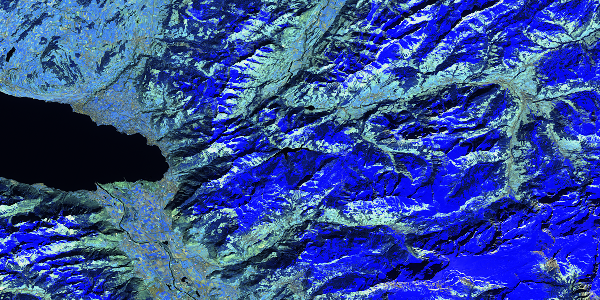

91_SWIR


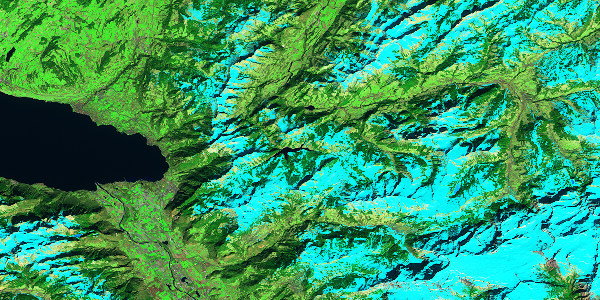

93-SWIR-2-11-12


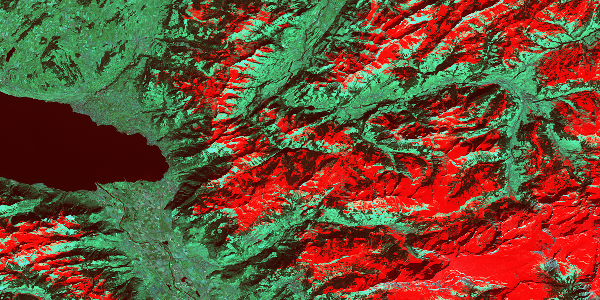

92_NDWI


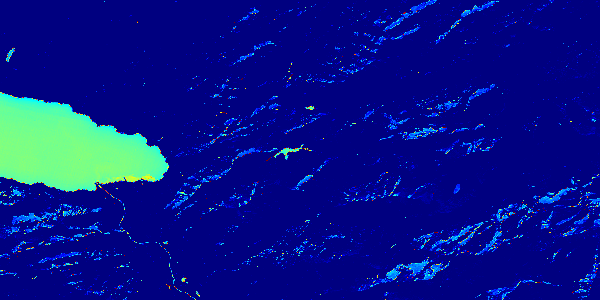

B01


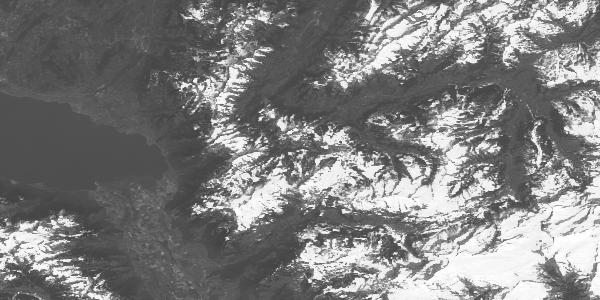

B02


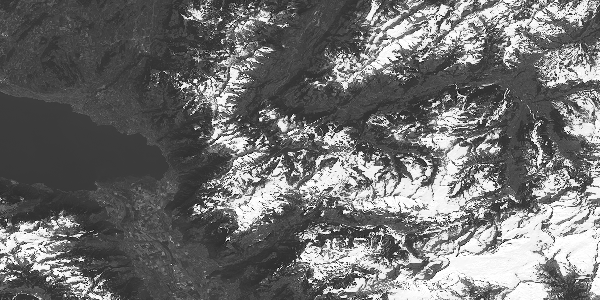

B03


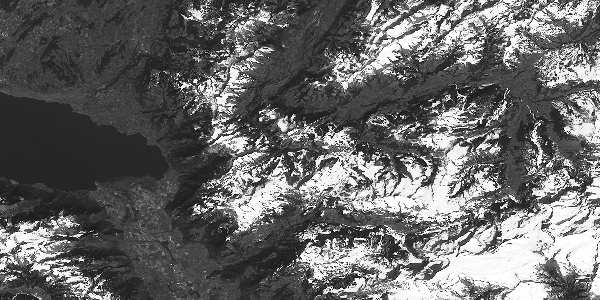

B04


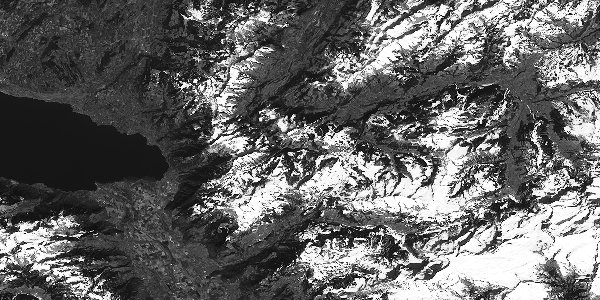

B05


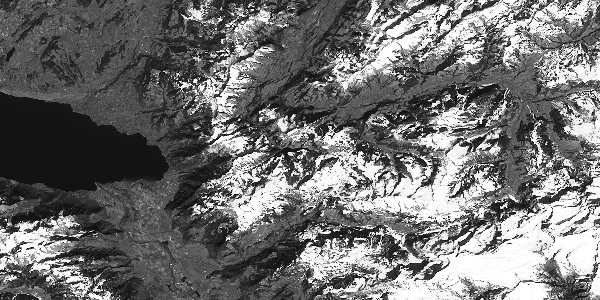

B06


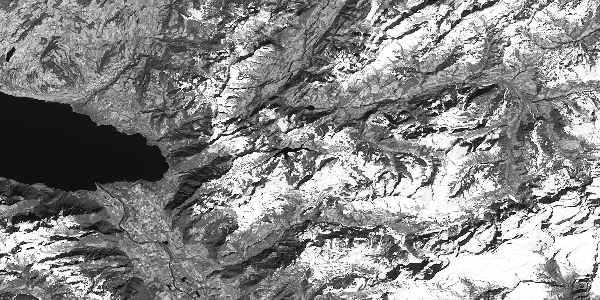

B07


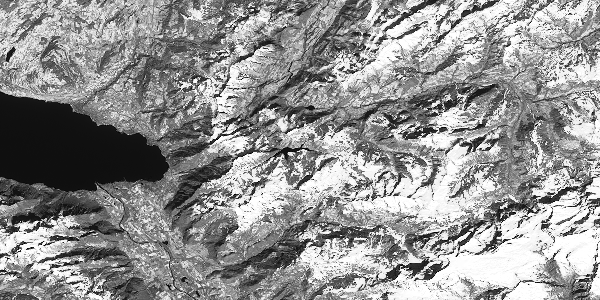

B08


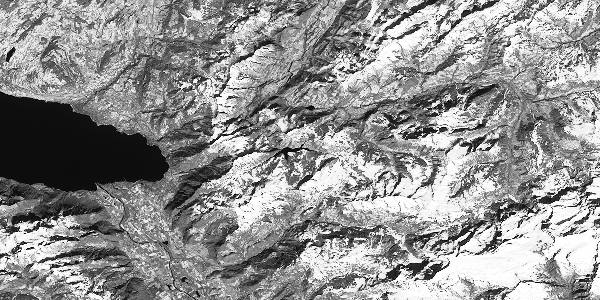

B09


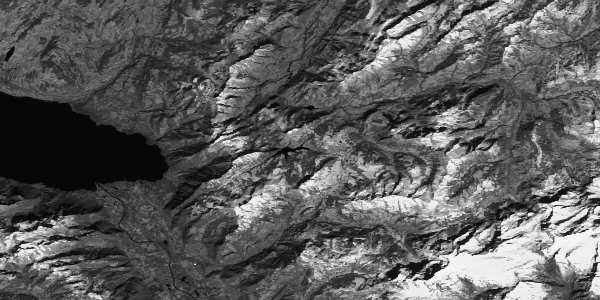

B10


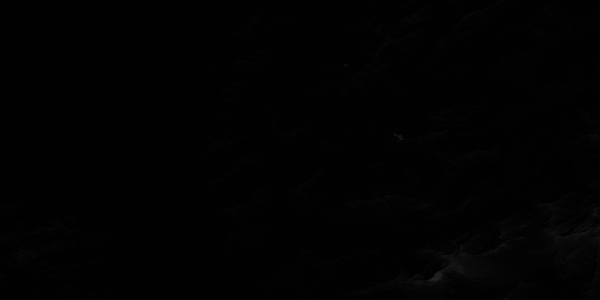

B11


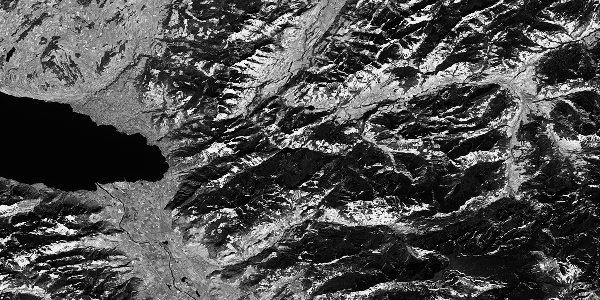

B12


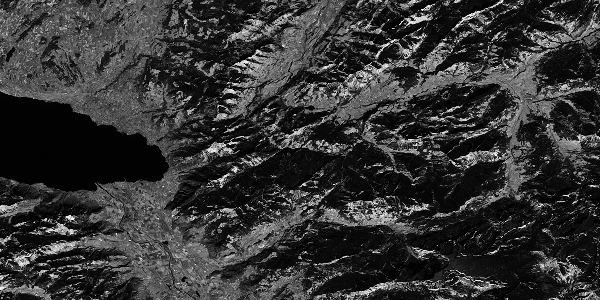

B8A


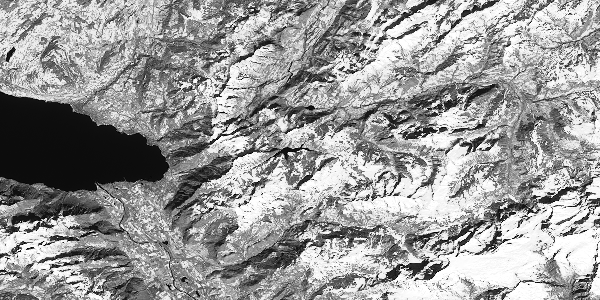

In [19]:
c = MundiCatalogue()
wms = c.get_collection("Sentinel2").mundi_wms('L1C')

layer = list(wms.contents)
print(layer)
for lay in layer:
    img = wms.getmap(layers=[wms[lay].name],
                     srs='EPSG:3857',
                     bbox=(752904.7286,5826183.1700,819252.0692,5871128.1426), # Toulouse
                     size=(600, 300),
                     format='image/png',
                     time='2022-03-21/2022-04-21',
                     showlogo=False,
                     transparent=False)
    print(wms[lay].name)
    display(Image.open(img))

In [9]:
# FIlters on map
img = wms.getmap(layers=["5_VEGETATION_INDEX"],
                     srs='EPSG:3857',
                     bbox=(752904.7286,5826183.1700,819252.0692,5871128.1426), # Toulouse
                     size=(1476, 1000),
                     format='image/png',
                     time='2022-03-21/2022-04-21',
                     showlogo=False,
                     transparent=False)
data = Image.open(img)
display(data)

ServiceException: <?xml version='1.0' encoding="UTF-8" standalone="no" ?>
<!DOCTYPE ServiceExceptionReport SYSTEM
 "http://schemas.opengis.net/wms/1.1.1/WMS_MS_Capabilities.dtd">
<ServiceExceptionReport version="1.1.1">
	<ServiceException code="LayerNotDefined">
		<![CDATA[ Layer 5_VEGETATION_INDEX not found ]]>
	</ServiceException>
</ServiceExceptionReport>

In [152]:
out = open("test2.png", 'wb')     
out.write(img.read())
out.close()

In [186]:
rbc = (46.285274888842004, 7.359466553089039)
lbc = (46.285274888842004, 6.763458251872402)

import geopy.distance
lwidth = geopy.distance.geodesic(rbc,lbc).m
print(lwidth)

45930.81620924521


In [187]:
metrperpixel = lwidth/1476
print(metrperpixel)

31.11843916615529


In [203]:
point = (46.378675,6.894264)
# distance to bottom
bdistans = geopy.distance.geodesic(point,(lbc[0],point[1])).m
print(f"Distans to bottom side {bdistans}m")
# distance to left side
ldistans = geopy.distance.geodesic(point,(point[0],lbc[1])).m
print(f"Distans to left side {ldistans}m")

Distans to bottom side 10382.151139465854m
Distans to left side 10063.298741856717m


In [208]:
pixel_coordinate = (1000 - bdistans/metrperpixel,ldistans/metrperpixel)

In [209]:
print(pixel_coordinate)

(666.3665846467782, 323.3870017748723)


In [212]:
scl_array = np.asarray(Image.open(img))
pixelsmap = scl_array.copy()

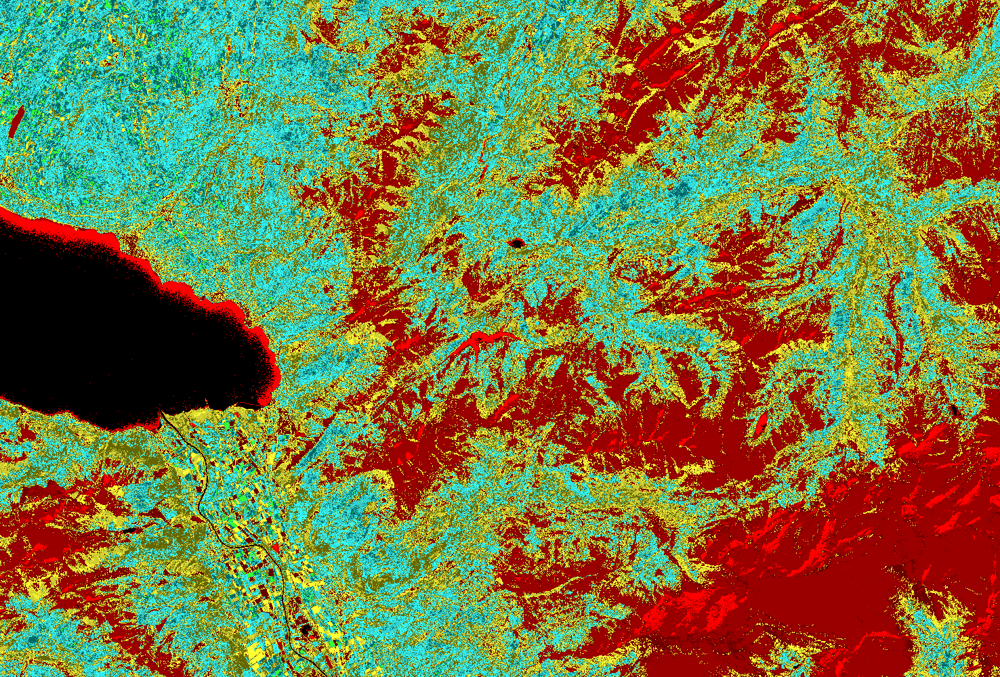

In [316]:
# CORDINATES TO PIXEL PARSER
bbox = (46.56358153431913,7.359466553089039,46.285274888842004,6.763458251872402)

import geopy.distance
def cordToPix(cordinates, bbox):
    print("Right bottom corner + Left bottom corner")
    rbc = (bbox[2],bbox[1])
    lbc = (bbox[2],bbox[3])
    print(f"rbc:{rbc} lbc:{lbc}")
    print("Length of photo")
    
    lwidth = geopy.distance.geodesic(rbc,lbc).m
    metrperpixel = lwidth/1476
    print(f"Width:{lwidth} Meter per pixel:{metrperpixel}")
    
    
    # distance to bottom
    bdistans = geopy.distance.geodesic(cordinates,(lbc[0],cordinates[1])).m
    print(f"Distans to bottom side {bdistans}m")
    # distance to left side
    ldistans = geopy.distance.geodesic(cordinates,(cordinates[0],lbc[1])).m
    print(f"Distans to left side {ldistans}m")
    
    
    pixel_cordinate = (1000 - bdistans/metrperpixel,ldistans/metrperpixel)
    print(f"Pixel cordinates {pixel_cordinate}")
    return pixel_cordinate
print(point)
print(bbox)
pix = cordToPix(point, bbox)


(46.378675, 6.894264)
(46.56358153431913, 7.359466553089039, 46.285274888842004, 6.763458251872402)
Right bottom corner + Left bottom corner
rbc:(46.285274888842004, 7.359466553089039) lbc:(46.285274888842004, 6.763458251872402)
Length of photo
Width:45930.81620924521 Meter per pixel:31.11843916615529
Distans to bottom side 10382.151139465854m
Distans to left side 10063.298741856717m
Pixel cordinates (666.3665846467782, 323.3870017748723)


In [384]:
# PIXEL TO CORDINATES (W PXY (DANE, 1000-DANE))
def platlon(pxy, bblatlon = [46.285274888842004, 6.763458251872402, 46.56358153431913, 7.359466553089039], h=1000, w=1476):

    dx = (bblatlon[3] - bblatlon[1]) / w
    dy = (bblatlon[2] - bblatlon[0]) / h
 
    return [bblatlon[0] + (pxy[1] * dy), bblatlon[1] + (pxy[0] * dx)]
platlon(pxy = (322,1000-666))

[46.378229308431365, 6.89348174305923]

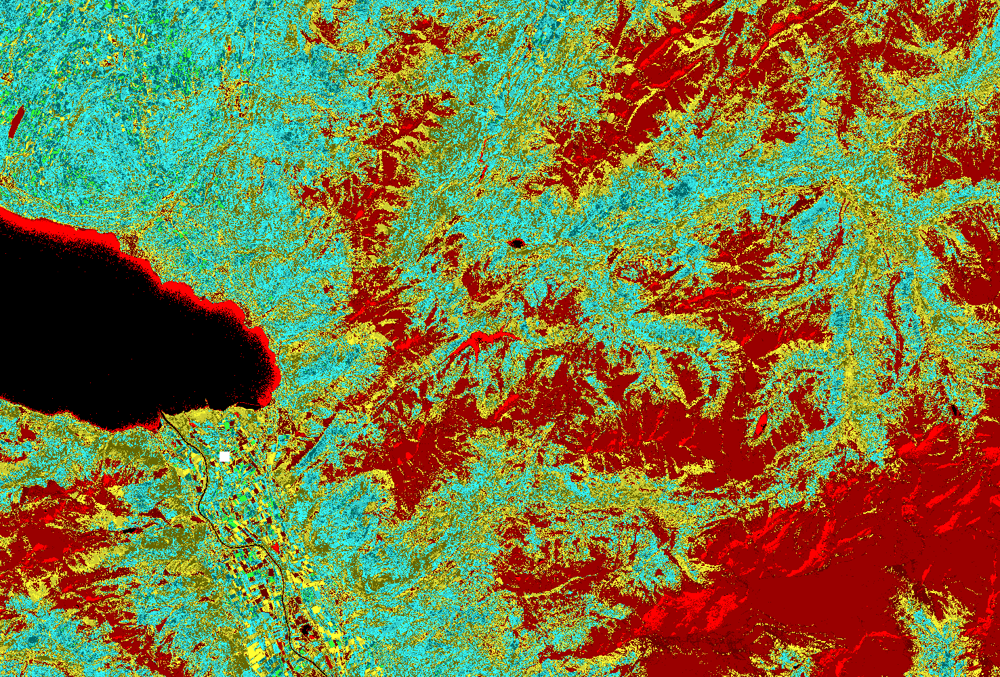

In [266]:
# GET DATA OVER MAP
import math
def lineover(img,pixelCords):
    
    img_array = np.asarray(Image.open(img))
    pixelsmap = img_array.copy()
    x = int(math.ceil(pixelCords[0]))
    y = int(math.ceil(pixelCords[1]))
  
    pixelsmap[x:x+15,y:y+15][:] = [0,0,0,0]
    display(Image.fromarray(pixelsmap))
    
lineover(img,pix)

(100, 200)
(100, 300)
(100, 400)
(100, 500)
(100, 500)
(100, 600)


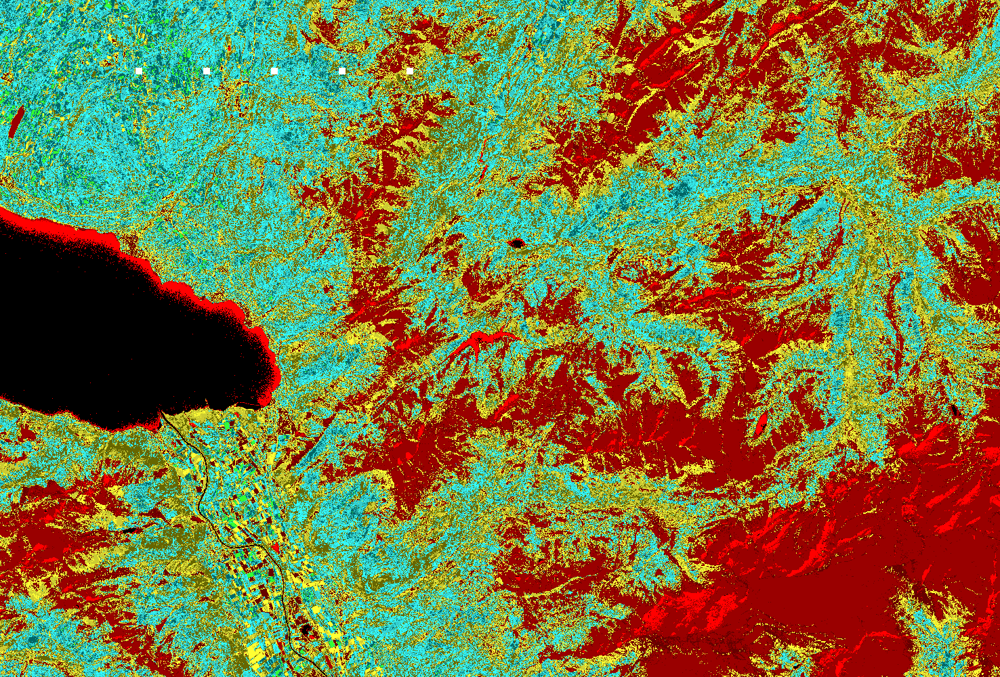

In [272]:
# LINE OVER COORDINATES
pixelArray = [(100,200),(100,300),(100,400),(100,500),(100,500),(100,600)]
def way(img,pixelArray):
    
    img_array = np.asarray(Image.open(img))
    pixelsmap = img_array.copy()
    
    numpyArray = np.array(pixelArray)
    for x in pixelArray:
        print(x)
        pixelsmap[x[0]:x[0]+10, x[1]:x[1]+10][:] =[0,0,0,0]

    
    display(Image.fromarray(pixelsmap))
way(img,pixelArray)

In [306]:
# FIND THE WAY
import time
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

grp = nx.Graph()
height = 999
width = 1475

# WATER = 0
# VEGETATION = 1
# DIRT = 2
# MOUNTAINS = 3
# ICE = 4

SCL_WATER_CostArray = np.matrix(
    [
        [100, 100],
        [100, 0],
    ]
)

SCLCostArray = np.matrix(
    [
        [100, 100, 100, 100, 100, 100, 100],
        [100, 0, 10, 50, 40, 40, 20],
        [100, 10, 0, 40, 30, 30, 15],
        [100, 50, 40, 40, 50, 40, 50],
        [100, 40, 30, 50, 90, 90, 40],
        [100, 40, 30, 40, 90, 50, 40],
        [100, 20, 15, 50, 40, 40, 15]
    ]
)

# SCLCostArray = np.matrix([[100, 100, 100, 90, 100],[100, 10, 40, 40, 100],[100, 40, 0, 80, 70],[90, 10, 80, 90, 100],[100, 100, 70, 100, 80]])
# SCLCostArray = np.matrix([[80, 60, 0, 100, 100],[100, 10, 0, 90, 100],[80, 40, 0, 100, 80],[90, 40, 0, 90, 100],[100, 0, 0, 100, 80]])

def getCost(pos1, pos2, filterType):
    return filterType[pos1, pos2]
def changeEdgeWeight(grp, n1, n2, n1Terrain, n2Terrain, filterType):
    oldWeight = grp.get_edge_data(n1, n2)["weight"]
    grp.add_edge(n1, n2, weight = oldWeight + getCost(n1Terrain,n2Terrain, filterType))

def updateWeights(grp, weigthArray, filterType):
    for i in range(0, height + 1):
        for j in range(0,width + 1):
            if i > 0:
                changeEdgeWeight(grp, str(i) + ' ' + str(j), str(i - 1) + ' ' + str(j), weigthArray[i][j], weigthArray[i - 1][j], filterType)
            if j < width:
                changeEdgeWeight(grp, str(i) + ' ' + str(j), str(i) + ' ' + str(j + 1), weigthArray[i][j], weigthArray[i][j + 1], filterType)

def generateGraph(grp):
    for i in range(0,height + 1):
        for j in range(0,width + 1):
            grp.add_node(str(i) + ' ' + str(j), layer = j)
            if i > 0:
                grp.add_edge(str(i) + ' ' + str(j), str(i - 1) + ' ' + str(j), weight = 0)
    #            if j < width:
    #                grp.add_edge(str(i) + str(j), str(i - 1) + str(j + 1), weight=random.randint(0, 101))
            if j < width:
                grp.add_edge(str(i) + ' ' + str(j), str(i) + ' ' + str(j + 1), weight = 0)
    #            if i < height:
    #                grp.add_edge(str(i) + str(j), str(i + 1) + str(j + 1), weight=random.randint(0, 101))
    return grp

def printGraph(grp):
    elarge = [(u, v) for (u, v, d) in grp.edges(data=True) if d["weight"] > 50]
    esmall = [(u, v) for (u, v, d) in grp.edges(data=True) if d["weight"] <= 50]

    pos = nx.multipartite_layout(grp, subset_key="layer")  # positions for all nodes - seed for reproducibility

    # nodes
    nx.draw_networkx_nodes(grp, pos, node_size=700)

    # edges
    nx.draw_networkx_edges(grp, pos, edgelist=elarge, width=6)
    nx.draw_networkx_edges(
        grp, pos, edgelist=esmall, width=6, alpha=0.5, edge_color="b", style="dashed"
    )

    # node labels
    nx.draw_networkx_labels(grp, pos, font_size=20, font_family="sans-serif")
    # edge weight labels
    edge_labels = nx.get_edge_attributes(grp, "weight")
    nx.draw_networkx_edge_labels(grp, pos, edge_labels)

    ax = plt.gca()
    ax.margins(0.08)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

def dist(a, b):
    (x1, y1) = a
    (x2, y2) = b
    return abs(x2-x1) + abs(y2-y1)

def getAStarPath(grp, pix1x, pix1y, pix2x, pix2y):
    tic = time.perf_counter()
    pathList = nx.astar_path(grp, str(pix1x) + ' ' + str(pix1y), str(pix2x) + ' ' + str(pix2y), weight='weight')
    pathPixPos = []
    for pix in pathList:
        temp = pix.split()
        pathPixPos.append((int(temp[0]), int(temp[1])))
    pathCostLis = []
    for n in range(0, len(pathList) - 1):
        pathCostLis.append(grp.get_edge_data(pathList[n], pathList[n + 1])["weight"])
    toc = time.perf_counter()
    print(f"Path found in {toc - tic:0.4f} seconds")
    return((pathPixPos, pathCostLis))

def getWeightArrayFromTxt(path):
    f = open(path, "r")
    weightArr = np.genfromtxt(path,dtype = int, delimiter=',')

    return weightArr


# testArray = np.random.randint(5, size=(height + 1,width + 1))
# print(testArray)
# testArray2 = np.random.randint(5, size=(height + 1,width + 1))
# print(testArray2)

tic = time.perf_counter()
grp = generateGraph(grp)
toc = time.perf_counter()
updateWeights(grp, getWeightArrayFromTxt("SCL.txt"), SCLCostArray)
updateWeights(grp, getWeightArrayFromTxt("SCL-WATER-ONLY.txt"), SCL_WATER_CostArray)
# updateWeights(grp, testArray2, SCLCostArray)
print(f"Graph generated in {toc - tic:0.4f} seconds")

#print(nx.astar_path(grp, '00', '99'))
routeData = getAStarPath(grp, 26, 73, 800, 26)
print(routeData)

#printGraph(grp)

Graph generated in 13.4989 seconds
Path found in 14.8756 seconds
([(26, 73), (26, 74), (26, 75), (27, 75), (28, 75), (29, 75), (30, 75), (30, 76), (30, 77), (30, 78), (30, 79), (30, 80), (30, 81), (30, 82), (30, 83), (30, 84), (30, 85), (30, 86), (30, 87), (30, 88), (30, 89), (30, 90), (30, 91), (30, 92), (30, 93), (30, 94), (30, 95), (30, 96), (30, 97), (30, 98), (30, 99), (30, 100), (30, 101), (30, 102), (30, 103), (30, 104), (30, 105), (30, 106), (30, 107), (30, 108), (30, 109), (30, 110), (30, 111), (30, 112), (30, 113), (30, 114), (30, 115), (30, 116), (30, 117), (30, 118), (30, 119), (30, 120), (30, 121), (30, 122), (30, 123), (30, 124), (30, 125), (30, 126), (30, 127), (30, 128), (30, 129), (31, 129), (31, 130), (32, 130), (33, 130), (34, 130), (35, 130), (35, 131), (35, 132), (35, 133), (35, 134), (35, 135), (35, 136), (35, 137), (35, 138), (35, 139), (35, 140), (35, 141), (35, 142), (35, 143), (35, 144), (35, 145), (35, 146), (35, 147), (35, 148), (35, 149), (35, 150), (35, 15

(26, 73)
(26, 74)
(26, 75)
(27, 75)
(28, 75)
(29, 75)
(30, 75)
(30, 76)
(30, 77)
(30, 78)
(30, 79)
(30, 80)
(30, 81)
(30, 82)
(30, 83)
(30, 84)
(30, 85)
(30, 86)
(30, 87)
(30, 88)
(30, 89)
(30, 90)
(30, 91)
(30, 92)
(30, 93)
(30, 94)
(30, 95)
(30, 96)
(30, 97)
(30, 98)
(30, 99)
(30, 100)
(30, 101)
(30, 102)
(30, 103)
(30, 104)
(30, 105)
(30, 106)
(30, 107)
(30, 108)
(30, 109)
(30, 110)
(30, 111)
(30, 112)
(30, 113)
(30, 114)
(30, 115)
(30, 116)
(30, 117)
(30, 118)
(30, 119)
(30, 120)
(30, 121)
(30, 122)
(30, 123)
(30, 124)
(30, 125)
(30, 126)
(30, 127)
(30, 128)
(30, 129)
(31, 129)
(31, 130)
(32, 130)
(33, 130)
(34, 130)
(35, 130)
(35, 131)
(35, 132)
(35, 133)
(35, 134)
(35, 135)
(35, 136)
(35, 137)
(35, 138)
(35, 139)
(35, 140)
(35, 141)
(35, 142)
(35, 143)
(35, 144)
(35, 145)
(35, 146)
(35, 147)
(35, 148)
(35, 149)
(35, 150)
(35, 151)
(35, 152)
(35, 153)
(35, 154)
(35, 155)
(35, 156)
(35, 157)
(35, 158)
(35, 159)
(35, 160)
(35, 161)
(35, 162)
(35, 163)
(35, 164)
(36, 164)
(36, 165)
(

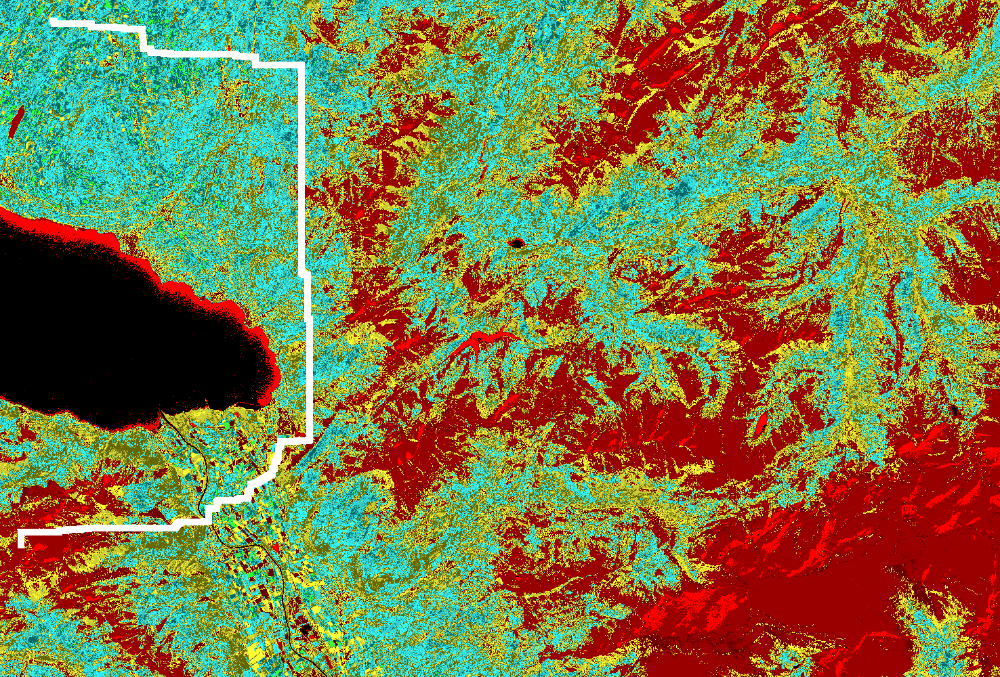

In [307]:

way(img,routeData[0])

1579
1579


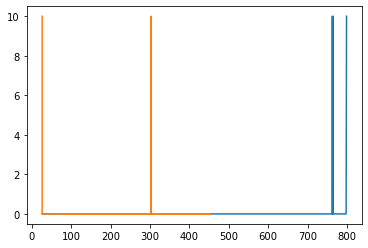

In [308]:

def valueWay(dataRoute):    
    x = np.array(dataRoute[0])
    y = np.array(dataRoute[1])
    lastElementIndex = len(x)-1
    
    x = x[:lastElementIndex]
    print(len(x))
    print(len(y))
    plt.plot(x,y)
    
    

    
valueWay(routeData)

In [317]:
# measurement of the route length

def longWay(bbox,way):
    
    print("Right bottom corner + Left bottom corner")
    rbc = (bbox[2],bbox[1])
    lbc = (bbox[2],bbox[3])
    print(f"rbc:{rbc} lbc:{lbc}")
    print("Length of photo")
    
    lwidth = geopy.distance.geodesic(rbc,lbc).m
    metrperpixel = lwidth/1476
    print(f"Width:{lwidth} Meter per pixel:{metrperpixel}")
    
    return len(way) * metrperpixel/1000

lenRoute = longWay(bbox,routeData[0])

Right bottom corner + Left bottom corner
rbc:(46.285274888842004, 7.359466553089039) lbc:(46.285274888842004, 6.763458251872402)
Length of photo
Width:45930.81620924521 Meter per pixel:31.11843916615529


In [366]:
# Sampling data for forecasting 10km one sample -TO DO
def routeForcecast(route,dataRoute):
    sampleRate = math.floor(route/10)
    pixelArray = dataRoute[0]
    
    if sampleRate == 1:
        print(pixelArray[len(kwantyzacja)//2])
        return 
    
    print(f"Samples {sampleRate}")
    kwantyzacja = math.floor(len(dataRoute[0])/sampleRate)
    print(kwantyzacja)
    print(len(pixelArray))
    
    for _ in range(sampleRate):
        print(pixelArray[_ * kwantyzacja])

            
routeForcecast(lenRoute,routeData)

    

Samples 4
395
1580
(26, 73)
(91, 403)
(440, 449)
(731, 351)


In [409]:
# ROUTE DATA PIXELS TO CORDINATES GPS UWAGA SA NA ODWROT XD
def routeToGPS(routeData):
    for x in routeData:
        data = (platlon(pxy = (x[0],1000 - x[0])))
        print(f"{[data[1],data[0]]},")
              
routeToGPS(routeData[0])

[6.792935627203577, 46.55634556153672],
[6.793339426865648, 46.55634556153672],
[6.793743226527719, 46.55634556153672],
[6.793743226527719, 46.556067254891246],
[6.793743226527719, 46.55578894824577],
[6.793743226527719, 46.55551064160029],
[6.793743226527719, 46.555232334954816],
[6.79414702618979, 46.555232334954816],
[6.794550825851861, 46.555232334954816],
[6.794954625513932, 46.555232334954816],
[6.795358425176002, 46.555232334954816],
[6.795762224838073, 46.555232334954816],
[6.7961660245001445, 46.555232334954816],
[6.796569824162215, 46.555232334954816],
[6.796973623824286, 46.555232334954816],
[6.797377423486357, 46.555232334954816],
[6.797781223148428, 46.555232334954816],
[6.7981850228104985, 46.555232334954816],
[6.79858882247257, 46.555232334954816],
[6.798992622134641, 46.555232334954816],
[6.799396421796711, 46.555232334954816],
[6.799800221458782, 46.555232334954816],
[6.800204021120853, 46.555232334954816],
[6.800607820782924, 46.555232334954816],
[6.801011620444995, 4

In [406]:
# SECOND ROUTE PLANNING WITH RAINING
# FIND THE WAY
import time
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

grp = nx.Graph()
height = 999
width = 1475

# WATER = 0
# VEGETATION = 1
# DIRT = 2
# MOUNTAINS = 3
# ICE = 4

SCL_WATER_CostArray = np.matrix(
    [
        [100, 100],
        [100, 0],
    ]
)

SCLCostArray = np.matrix(
    [
        [100, 100, 100, 100, 100, 100, 100],
        [100, 0, 10, 50, 40, 40, 20],
        [100, 10, 0, 40, 30, 30, 15],
        [100, 50, 40, 40, 50, 40, 50],
        [100, 40, 30, 50, 90, 90, 40],
        [100, 40, 30, 40, 90, 50, 40],
        [100, 20, 15, 50, 40, 40, 15]
    ]
)

# SCLCostArray = np.matrix([[100, 100, 100, 90, 100],[100, 10, 40, 40, 100],[100, 40, 0, 80, 70],[90, 10, 80, 90, 100],[100, 100, 70, 100, 80]])
# SCLCostArray = np.matrix([[80, 60, 0, 100, 100],[100, 10, 0, 90, 100],[80, 40, 0, 100, 80],[90, 40, 0, 90, 100],[100, 0, 0, 100, 80]])

def getCost(pos1, pos2, filterType):
    return filterType[pos1, pos2]
def changeEdgeWeight(grp, n1, n2, n1Terrain, n2Terrain, filterType):
    oldWeight = grp.get_edge_data(n1, n2)["weight"]
    grp.add_edge(n1, n2, weight = oldWeight + getCost(n1Terrain,n2Terrain, filterType))

def updateWeights(grp, weigthArray, filterType):
    for i in range(0, height + 1):
        for j in range(0,width + 1):
            if i > 0:
                changeEdgeWeight(grp, str(i) + ' ' + str(j), str(i - 1) + ' ' + str(j), weigthArray[i][j], weigthArray[i - 1][j], filterType)
            if j < width:
                changeEdgeWeight(grp, str(i) + ' ' + str(j), str(i) + ' ' + str(j + 1), weigthArray[i][j], weigthArray[i][j + 1], filterType)

def generateGraph(grp):
    for i in range(0,height + 1):
        for j in range(0,width + 1):
            grp.add_node(str(i) + ' ' + str(j), layer = j)
            if i > 0:
                grp.add_edge(str(i) + ' ' + str(j), str(i - 1) + ' ' + str(j), weight = 0)
    #            if j < width:
    #                grp.add_edge(str(i) + str(j), str(i - 1) + str(j + 1), weight=random.randint(0, 101))
            if j < width:
                grp.add_edge(str(i) + ' ' + str(j), str(i) + ' ' + str(j + 1), weight = 0)
    #            if i < height:
    #                grp.add_edge(str(i) + str(j), str(i + 1) + str(j + 1), weight=random.randint(0, 101))
    return grp

def printGraph(grp):
    elarge = [(u, v) for (u, v, d) in grp.edges(data=True) if d["weight"] > 50]
    esmall = [(u, v) for (u, v, d) in grp.edges(data=True) if d["weight"] <= 50]

    pos = nx.multipartite_layout(grp, subset_key="layer")  # positions for all nodes - seed for reproducibility

    # nodes
    nx.draw_networkx_nodes(grp, pos, node_size=700)

    # edges
    nx.draw_networkx_edges(grp, pos, edgelist=elarge, width=6)
    nx.draw_networkx_edges(
        grp, pos, edgelist=esmall, width=6, alpha=0.5, edge_color="b", style="dashed"
    )

    # node labels
    nx.draw_networkx_labels(grp, pos, font_size=20, font_family="sans-serif")
    # edge weight labels
    edge_labels = nx.get_edge_attributes(grp, "weight")
    nx.draw_networkx_edge_labels(grp, pos, edge_labels)

    ax = plt.gca()
    ax.margins(0.08)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

def dist(a, b):
    (x1, y1) = a
    (x2, y2) = b
    return abs(x2-x1) + abs(y2-y1)

def getAStarPath(grp, pix1x, pix1y, pix2x, pix2y):
    tic = time.perf_counter()
    pathList = nx.astar_path(grp, str(pix1x) + ' ' + str(pix1y), str(pix2x) + ' ' + str(pix2y), weight='weight')
    pathPixPos = []
    for pix in pathList:
        temp = pix.split()
        pathPixPos.append((int(temp[0]), int(temp[1])))
    pathCostLis = []
    for n in range(0, len(pathList) - 1):
        pathCostLis.append(grp.get_edge_data(pathList[n], pathList[n + 1])["weight"])
    toc = time.perf_counter()
    print(f"Path found in {toc - tic:0.4f} seconds")
    return((pathPixPos, pathCostLis))

def getWeightArrayFromTxt(path):
    f = open(path, "r")
    weightArr = np.genfromtxt(path,dtype = int, delimiter=',')

    return weightArr


# testArray = np.random.randint(5, size=(height + 1,width + 1))
# print(testArray)
# testArray2 = np.random.randint(5, size=(height + 1,width + 1))
# print(testArray2)

tic = time.perf_counter()
grp = generateGraph(grp)
toc = time.perf_counter()
updateWeights(grp, getWeightArrayFromTxt("SCL.txt"), SCLCostArray)
updateWeights(grp, getWeightArrayFromTxt("SCL-WATER-ONLY.txt"), SCL_WATER_CostArray)
# updateWeights(grp, testArray2, SCLCostArray)
print(f"Graph generated in {toc - tic:0.4f} seconds")

#print(nx.astar_path(grp, '00', '99'))
routeData = getAStarPath(grp, 26, 73, 800, 26)
print(routeData)

Graph generated in 14.0495 seconds
Path found in 14.0282 seconds
([(26, 73), (26, 74), (26, 75), (27, 75), (28, 75), (29, 75), (30, 75), (30, 76), (30, 77), (30, 78), (30, 79), (30, 80), (30, 81), (30, 82), (30, 83), (30, 84), (30, 85), (30, 86), (30, 87), (30, 88), (30, 89), (30, 90), (30, 91), (30, 92), (30, 93), (30, 94), (30, 95), (30, 96), (30, 97), (30, 98), (30, 99), (30, 100), (30, 101), (30, 102), (30, 103), (30, 104), (30, 105), (30, 106), (30, 107), (30, 108), (30, 109), (30, 110), (30, 111), (30, 112), (30, 113), (30, 114), (30, 115), (30, 116), (30, 117), (30, 118), (30, 119), (30, 120), (30, 121), (30, 122), (30, 123), (30, 124), (30, 125), (30, 126), (30, 127), (30, 128), (30, 129), (31, 129), (31, 130), (32, 130), (33, 130), (34, 130), (35, 130), (35, 131), (35, 132), (35, 133), (35, 134), (35, 135), (35, 136), (35, 137), (35, 138), (35, 139), (35, 140), (35, 141), (35, 142), (35, 143), (35, 144), (35, 145), (35, 146), (35, 147), (35, 148), (35, 149), (35, 150), (35, 15

(26, 73)
(26, 74)
(26, 75)
(27, 75)
(28, 75)
(29, 75)
(30, 75)
(30, 76)
(30, 77)
(30, 78)
(30, 79)
(30, 80)
(30, 81)
(30, 82)
(30, 83)
(30, 84)
(30, 85)
(30, 86)
(30, 87)
(30, 88)
(30, 89)
(30, 90)
(30, 91)
(30, 92)
(30, 93)
(30, 94)
(30, 95)
(30, 96)
(30, 97)
(30, 98)
(30, 99)
(30, 100)
(30, 101)
(30, 102)
(30, 103)
(30, 104)
(30, 105)
(30, 106)
(30, 107)
(30, 108)
(30, 109)
(30, 110)
(30, 111)
(30, 112)
(30, 113)
(30, 114)
(30, 115)
(30, 116)
(30, 117)
(30, 118)
(30, 119)
(30, 120)
(30, 121)
(30, 122)
(30, 123)
(30, 124)
(30, 125)
(30, 126)
(30, 127)
(30, 128)
(30, 129)
(31, 129)
(31, 130)
(32, 130)
(33, 130)
(34, 130)
(35, 130)
(35, 131)
(35, 132)
(35, 133)
(35, 134)
(35, 135)
(35, 136)
(35, 137)
(35, 138)
(35, 139)
(35, 140)
(35, 141)
(35, 142)
(35, 143)
(35, 144)
(35, 145)
(35, 146)
(35, 147)
(35, 148)
(35, 149)
(35, 150)
(35, 151)
(35, 152)
(35, 153)
(35, 154)
(35, 155)
(35, 156)
(35, 157)
(35, 158)
(35, 159)
(35, 160)
(35, 161)
(35, 162)
(35, 163)
(35, 164)
(36, 164)
(36, 165)
(

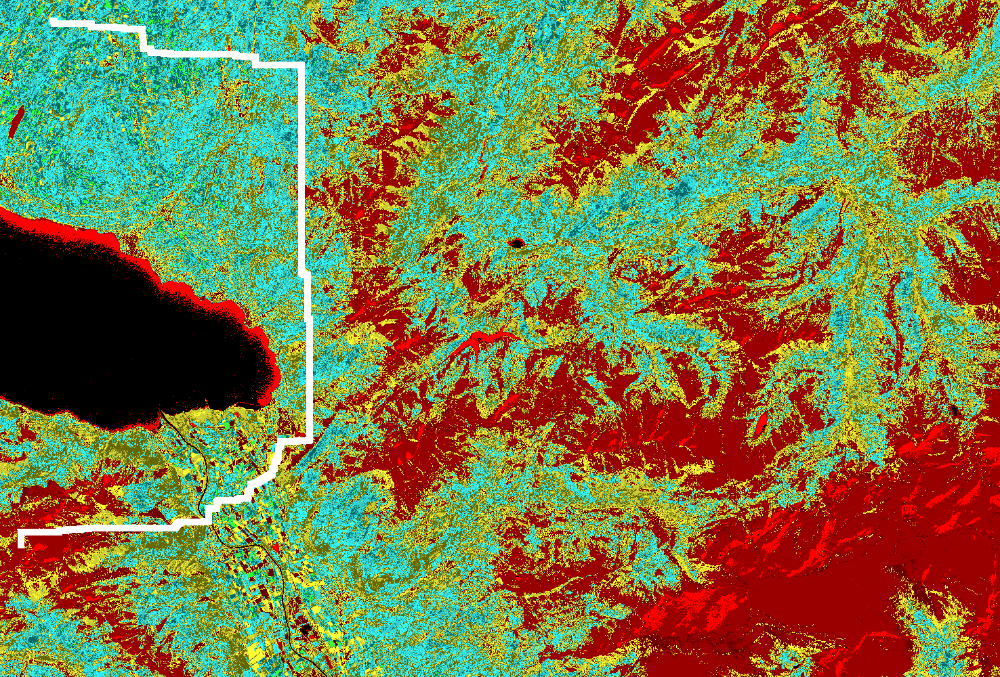

In [407]:
way(img,routeData[0])